<img src="Images/cover_readme.png" alt="Example Image" style="width:1400px; height:400px;" >

---
# **DeepCellMap - ROI definition**
---

<b>The notebook can be used to manually define regions of interest in the tissue.</b>

- 1. Manual ROI segmentation
- 2. ROI definition by its coordinates

Once a region of interest has been defined. It is reconstructed using the procedure described in C in the following figure.

<img src="Images/process_reconstruction.png" alt="Example Image" style="width:900px; height:800px;" >


In [1]:
from grabber import *  # This imports your common setup code from grabber.py
 
%precision 2
%load_ext autoreload
%autoreload 2 

import json
from config.base_config import BaseConfig
from utils.util import *
from utils.util_colors_drawing import *
from utils.util_fig_display import *
# from utils.const import *
from preprocessing import filter
from preprocessing import slide
from preprocessing import tiles
from stat_analysis import deep_cell_map
from segmentation_classification import segmentation
from segmentation_classification.classification import ModelClassification, segment_classify_cells_wsi
from region_of_interest import Roi


from stat_analysis.colocalisation_analysis import ColocAnalysis
from stat_analysis.dbscan_analysis import DbscanAnalysis
from stat_analysis.neighbours_analysis import NeighborsAnalysis

from config.dataset_management import take_config_from_dataset

# %matplotlib inline 


Pb importing pylibCZIrw
Pb importing pylibCZIrw


## Dataset selection 

In [2]:
display(dataframe_dropdown)
dataset_name = dataframe_dropdown.value

Dropdown(description='Select dataset:', options={'generated_rois': 'generated_rois', 'ihc_microglia_fetal_huma…

In [3]:
dataset_name = dataframe_dropdown.value
dataset_config = take_config_from_dataset(dataset_name)
print(blue("We are playing with the dataset: {}".format(dataset_config.dataset_name)))


We are playing with the dataset: ihc_microglia_fetal_human_brain_database


----
## **2. ROI definition by its coordinates**
----

To select a ROI in the tissue at a given time and apply DeepCellMap to it, open the file root/info_images.html, click on the image of interest showing the tiles, and choose the coordinates of the tiles at the top left (origin_row, origin_col) and bottom right (end_row, end_col) of the chosen ROI. Then enter the coordinates in the ROI dictionary below.

In [ ]:
slide_num= 1
entire_image = False 
channels_of_interest = None#[1,2,3]
if entire_image : 
    origin_row, origin_col, end_row, end_col = None, None,None,None
else : 
    origin_row, origin_col, end_row, end_col = 17,16,20,20

output_path_name = "IHC"

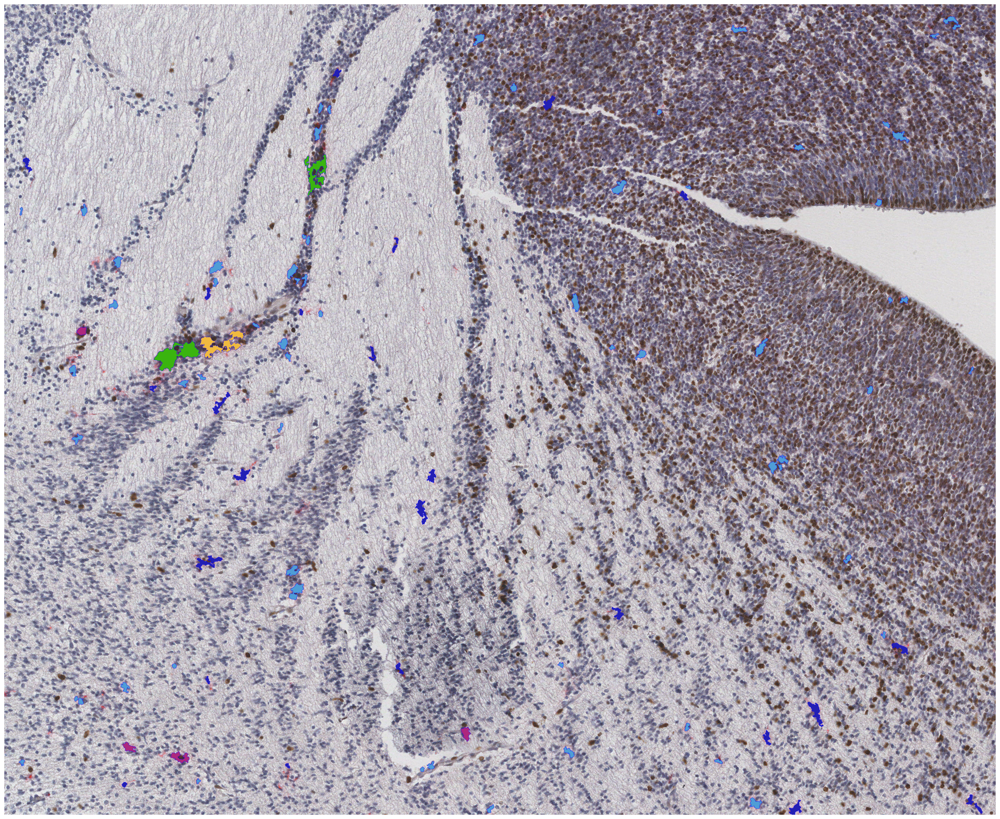

In [11]:
# Creation of the ROI 
roi = Roi(dataset_config,slide_num, origin_row, origin_col, end_row, end_col,entire_image=entire_image)

#Get tissue mask 
roi.get_mask_tissue()

#Visualisation RGB et channels 
roi.get_img_original(channels_of_interest = "all_as_rgb")
# roi.display_save_img_original(save = True)

# # #Get table cells 
roi.get_table_cells(filter_cells_from_several_channels=False)

# # #Get mask regions 
roi.get_cell_masks()

# # #get predictions and masks 
roi.display_segmented_cells(save_fig = True,output_path_name=output_path_name)

# # #get roi statistics 
roi.get_statistics_roi(save = True)


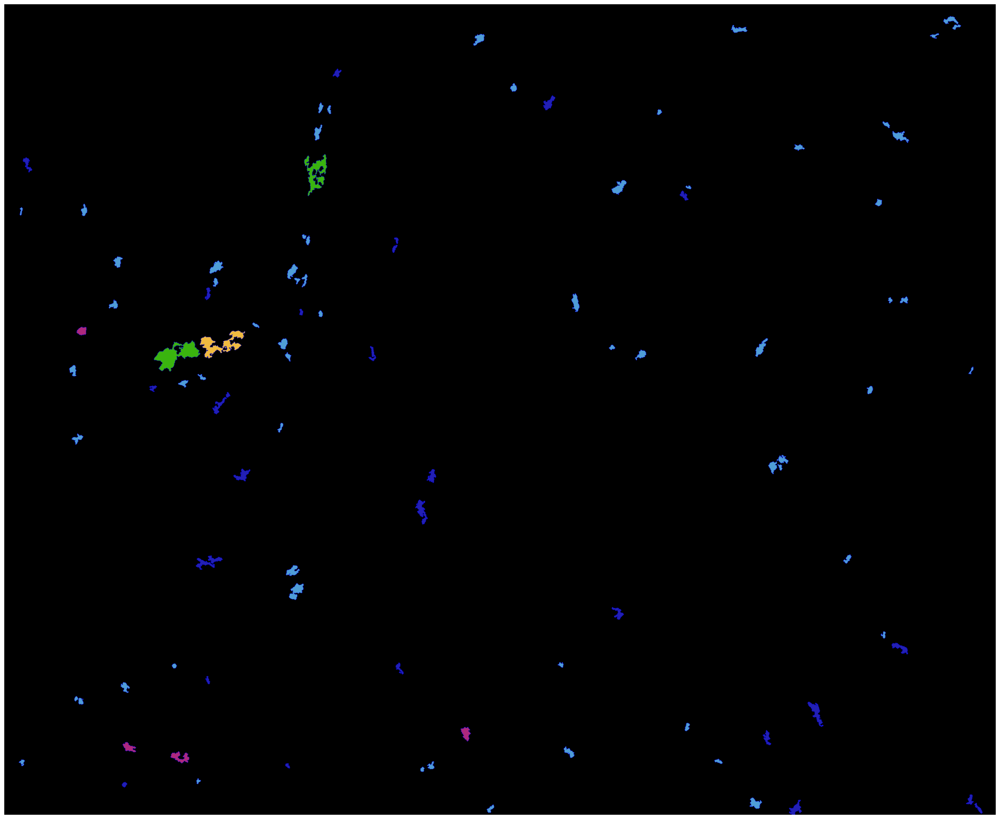

In [12]:
%matplotlib inline 
roi.display_segmented_cells(save_fig = True, with_background = False,output_path_name=output_path_name )


# 3. DeepCellMap application on the ROI

1. Colocalisation analysis 
2. DBSCAN analysis 
3. Neighbors analysis 

### 3.1 - Colocalisation analysis 

In [ ]:
display_B_in_A_levelsets = True 

coloc_analysis = ColocAnalysis(roi)
if display_B_in_A_levelsets : 
    coloc_analysis.display_B_in_A_levelsets()

# coloc_analysis.visualise_z_score()
# coloc_analysis.heatmap_colocalisation(feature_name= "association_score", proba = False)
# coloc_analysis.heatmap_colocalisation(feature_name= "distance_association", proba = False)

### Colocalisation with several parameters 

In [ ]:
param_colocalisation= dict({
    "1":[0,50,100,150,200,250,300,350,400,450,500,550,600,650,700,750,800,850,900,950,1000,1050,1100,1150,1200],
    "2":[0,100,200,300,400,500,600,700,800,900,1000,1100,1200],
    "3":[0,100,200,300,400,500]})
#Colocalisation 
for key,levelsets in param_colocalisation.items():
    print("key,levelsets")
    coloc_analysis = ColocAnalysis(roi,levelsets = levelsets)
    # coloc_analysis.visualise_z_score()
    # coloc_analysis.heatmap_colocalisation(feature_name= "association_score", proba = False)
    # coloc_analysis.heatmap_colocalisation(feature_name= "distance_association", proba = False)
    coloc_analysis.display_B_in_A_levelsets()

### 3.2 - DBSCAN analysis 

In [ ]:

display_figure_clusters_convex_hulls = True
dbscan_analysis = DbscanAnalysis(roi,min_sample=3)
if display_figure_clusters_convex_hulls :
    dbscan_analysis.display_convex_hull(robust_clusters_only=True)

### DBSCAN with several parameters 

In [ ]:

display_figure_clusters_convex_hulls = True

ms_param = [3,4,5,6,7,8,9,10,11]

for min_sample in ms_param:
    print("DBSCAN with epsilon = {}".format(min_sample))
    dbscan_analysis = DbscanAnalysis(roi,min_sample=min_sample)
    if display_figure_clusters_convex_hulls :
        dbscan_analysis.display_convex_hull(robust_clusters_only=True)

### 3.2 - Neighbors analysis 

In [ ]:

neighbors_analysis = NeighborsAnalysis(roi)

### Merge statistical methods results  

In [ ]:
results_entire_image =  roi.get_df_entire_image()